## **Cyling Into New Markets**

# Business Understanding

The city of Merrytown is interested in adding bicycles to the downtown area.  They'd love to see citizens cycling over driving on daily commutes, when possible, and spending weekends visiting all their favorite places by bike.  Studies have shown how cycling can improve both physical and mental health along with cutting down on traffic, minimizing noise and emissions pollution, and increase urban livability.

In addition, it is cheaper to build and maintain the infrastructure for bikes over cars.  That said, prior to making the move to purchase the bikes and set up the infrastructure, the city of Merrytown wanted to analyze the likelihood that the new bicycles would be a success.  They would like to be able to predict the time that these bikes would be used.

# Data Understanding

The city of Austin, Texas, comparable to Merrytown in population demographics, climate and infrastructure, has maintained records of their city bicycles for years, including routes, duration of rides, type of user and the date of the ride.

This data includes information on nearly 650,000 bicycle rides over 1,000 plus different days.

In addition to the data on cycling, our analysis requires the weather information for the city over the same time span.  Austin KATT station has recorded that data and made it readily available on WeatherUnderground.com.  The weather data includes information on temperature, dew point, humidity, sea level, visibility, and wind.  Events such as thunderstorms, fog, and rain are also noted.   


In [3]:
import pandas as pd
import numpy as np
import json
import os
from pathlib import Path
import itertools
import matplotlib.pyplot as plt
import folium
from folium.plugins import HeatMap
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
import warnings
warnings.filterwarnings('ignore')

In [4]:
# your api key
api_key = {"username":"jordanscriven","key":"e5106fbfe916ab4bce0178f4f860ceda"}

# uses pathlib Path
kaggle_path = Path('/root/.kaggle')
os.makedirs(kaggle_path, exist_ok=True)

# opens file and dumps python dict to json object
with open (kaggle_path/'kaggle.json', 'w') as handl:
    json.dump(api_key,handl)

os.chmod(kaggle_path/'kaggle.json', 600)

In [5]:
# from google.colab import drive
# files.upload()

# !pip install -q kaggle

!kaggle datasets download jboysen/austin-bike
!kaggle datasets download grubenm/austin-weather

# {"username":"jordanscriven","key":"e5106fbfe916ab4bce0178f4f860ceda"}


Dataset URL: https://www.kaggle.com/datasets/jboysen/austin-bike
License(s): CC0-1.0
 84% 14.0M/16.7M [00:00<00:00, 146MB/s]
100% 16.7M/16.7M [00:00<00:00, 147MB/s]
Dataset URL: https://www.kaggle.com/datasets/grubenm/austin-weather
License(s): GPL-2.0
  0% 0.00/28.8k [00:00<?, ?B/s]
100% 28.8k/28.8k [00:00<00:00, 73.5MB/s]


In [6]:
!unzip austin-bike.zip
!unzip austin-weather.zip

Archive:  austin-bike.zip
  inflating: austin_bikeshare_stations.csv  
  inflating: austin_bikeshare_trips.csv  
Archive:  austin-weather.zip
  inflating: austin_weather.csv      


In [7]:
trips = pd.read_csv('austin_bikeshare_trips.csv')
stations = pd.read_csv('austin_bikeshare_stations.csv')
weather = pd.read_csv('austin_weather.csv')

In [8]:
trips.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 649231 entries, 0 to 649230
Data columns (total 12 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   bikeid              648508 non-null  float64
 1   checkout_time       649231 non-null  object 
 2   duration_minutes    649231 non-null  int64  
 3   end_station_id      629389 non-null  float64
 4   end_station_name    649231 non-null  object 
 5   month               618479 non-null  float64
 6   start_station_id    630190 non-null  float64
 7   start_station_name  649231 non-null  object 
 8   start_time          649231 non-null  object 
 9   subscriber_type     647154 non-null  object 
 10  trip_id             649231 non-null  int64  
 11  year                618479 non-null  float64
dtypes: float64(5), int64(2), object(5)
memory usage: 59.4+ MB


In [9]:
trips.dropna(inplace=True)
trips.info()

<class 'pandas.core.frame.DataFrame'>
Index: 581625 entries, 0 to 649230
Data columns (total 12 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   bikeid              581625 non-null  float64
 1   checkout_time       581625 non-null  object 
 2   duration_minutes    581625 non-null  int64  
 3   end_station_id      581625 non-null  float64
 4   end_station_name    581625 non-null  object 
 5   month               581625 non-null  float64
 6   start_station_id    581625 non-null  float64
 7   start_station_name  581625 non-null  object 
 8   start_time          581625 non-null  object 
 9   subscriber_type     581625 non-null  object 
 10  trip_id             581625 non-null  int64  
 11  year                581625 non-null  float64
dtypes: float64(5), int64(2), object(5)
memory usage: 57.7+ MB


In [10]:
stations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72 entries, 0 to 71
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   latitude    72 non-null     float64
 1   location    72 non-null     object 
 2   longitude   72 non-null     float64
 3   name        72 non-null     object 
 4   station_id  72 non-null     int64  
 5   status      72 non-null     object 
dtypes: float64(2), int64(1), object(3)
memory usage: 3.5+ KB


In [11]:
trips.describe()

,bikeid,duration_minutes,end_station_id,month,start_station_id,trip_id,year
count,581625.000000,581625.000000,581625.000000,581625.000000,581625.000000,5.816250e+05,581625.000000
mean,471.826670,28.310246,2574.792435,5.860260,2577.152834,5.421505e+09,2015.391998
std,323.135371,69.725709,311.383221,3.223614,312.254127,4.922198e+09,1.011099
min,3.000000,0.000000,1001.000000,1.000000,1001.000000,8.269930e+06,2013.000000
25%,208.000000,8.000000,2499.000000,3.000000,2501.000000,1.231843e+07,2015.000000
50%,420.000000,14.000000,2548.000000,5.000000,2549.000000,9.900028e+09,2015.000000
75%,745.000000,27.000000,2570.000000,9.000000,2570.000000,9.900192e+09,2016.000000
max,5089.000000,10981.000000,3687.000000,12.000000,3687.000000,9.900353e+09,2017.000000


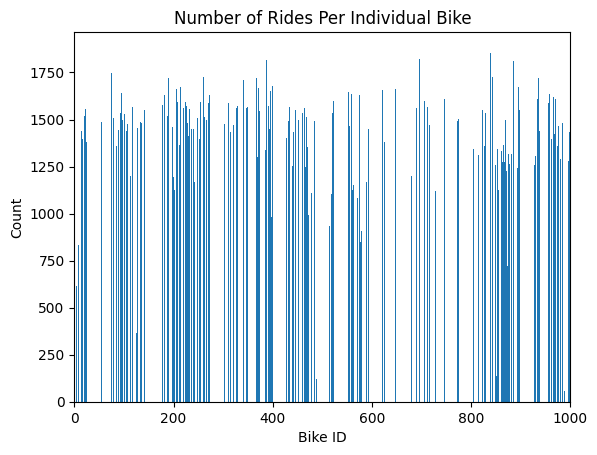

In [12]:
tripsperbike = trips['bikeid'].value_counts()
plt.bar(tripsperbike.index, tripsperbike.values)
plt.xlabel('Bike ID')
plt.xlim(0,1000)
plt.ylabel('Count')
plt.title('Number of Rides Per Individual Bike')
plt.show()

# Data Preparation

In a first step to analyzing the data, we clean it up - We removed outliers for very long bike rides, which may be the result of a bike being lost or never returned.  We check for roundtrips that didn't last more than a minute, indicating the bike was not used, and removed those.  Our database is large enough that we can remove those records with missing information.

In [13]:
# remove outliers of very long bike rides
((trips['duration_minutes']>60).sum())/(trips['duration_minutes'].count())

np.float64(0.09352933591231463)

In [14]:
trips = trips[trips['duration_minutes']<60]
trips.describe()

,bikeid,duration_minutes,end_station_id,month,start_station_id,trip_id,year
count,525876.000000,525876.000000,525876.000000,525876.000000,525876.000000,5.258760e+05,525876.000000
mean,471.864065,16.337715,2573.059472,5.872411,2575.779283,5.446467e+09,2015.389343
std,323.207271,12.530547,313.335800,3.231836,314.813296,4.919782e+09,1.006235
min,3.000000,0.000000,1002.000000,1.000000,1001.000000,8.269930e+06,2013.000000
25%,209.000000,7.000000,2499.000000,3.000000,2501.000000,1.231980e+07,2015.000000
50%,420.000000,13.000000,2548.000000,5.000000,2549.000000,9.900030e+09,2015.000000
75%,745.000000,22.000000,2570.000000,9.000000,2570.000000,9.900194e+09,2016.000000
max,5089.000000,59.000000,3687.000000,12.000000,3687.000000,9.900353e+09,2017.000000


In [15]:
# find trips that weren't actually used
trips['roundtrip'] = trips['start_station_id'] == trips['end_station_id']
count_shorttrips_roundtrip = ((trips['duration_minutes']<2) & (trips['roundtrip']==True)).sum()
count_shorttrips_all = ((trips['duration_minutes']<2)).sum()
print(count_shorttrips_all)
print(count_shorttrips_roundtrip)
# 83% of the trips lasting less than 2 minutes are roundtrip which indicates the bike was removed and then immediately returned so I removed those records

18309
15206


# Exploratory Data Analysis

To analyze the data and determine that it is a good fit for our predicitions in Merrytown, we look at many things.  We examine the most common routes, number of rides per month and per day of week and duration of rides based on month and day of the week.

In seeing that there are spikes in number of rides per month in March and October, we find these coincide with the high levels of tourism in Austin at that time due to the SouthbySouthwest and Austin City Limits music festivals.  We removed any data corresponding to those dates.

Finally, we used time series data to combine the cycling data with the weather data, while cleaning that data set to use only average information, not highs and lows, coding the weather events in binary, etc.

In [16]:
# finding most popular routes
trips = trips[trips['duration_minutes']>=2]
trips['route'] = trips['start_station_name'] + ' - ' + trips['end_station_name']
routes = trips['route'].value_counts()
routes.head(10)

,count
route,
Riverside @ S. Lamar - Riverside @ S. Lamar,5301
Rainey St @ Cummings - Rainey St @ Cummings,3002
5th & Bowie - 4th & Congress,2330
4th & Congress - 5th & Bowie,2141
Capitol Station / Congress & 11th - Capitol Station / Congress & 11th,2096
Zilker Park - Zilker Park,2036
Pfluger Bridge @ W 2nd Street - Pfluger Bridge @ W 2nd Street,2015
5th & Bowie - City Hall / Lavaca & 2nd,2003
City Hall / Lavaca & 2nd - City Hall / Lavaca & 2nd,1898


In [51]:
# bring in station location for maping from station dataset
trips = pd.merge(trips, stations[['station_id','latitude','longitude']], left_on='start_station_id', right_on='station_id')
trips.rename(columns={'latitude':'start_latitude','longitude':'start_longitude'}, inplace=True)
trips = pd.merge(trips, stations[['station_id','latitude','longitude']], left_on='end_station_id', right_on='station_id')
trips.rename(columns={'latitude':'end_latitude','longitude':'end_longitude'}, inplace=True)
trips.drop(columns=['station_id_x','station_id_y'], inplace=True)
trips.head()

,bikeid,checkout_time,duration_minutes,end_station_id,end_station_name,month,start_station_id,start_station_name,start_time,subscriber_type,...,end_latitude,end_longitude,DateAll,Date,Time,DayofWeek,start_latitude,start_longitude,end_latitude,end_longitude
0,141.0,2:06:04,6,2570.0,South Congress & Academy,10.0,2494.0,2nd & Congress,2016-10-30 02:06:04,Local365,...,30.25226,-97.74854,2016-10-30 02:06:04,2016-10-30,1900-01-01 02:06:04,6,30.26408,-97.74355,30.25226,-97.74854
1,86.0,15:39:13,25,3377.0,MoPac Pedestrian Bridge @ Veterans Drive,4.0,2707.0,Rainey St @ Cummings,2017-04-16 15:39:13,Walk Up,...,30.27466,-97.77028,2017-04-16 15:39:13,2017-04-16,1900-01-01 15:39:13,6,30.25579,-97.73982,30.27466,-97.77028
2,861.0,15:12:00,29,2537.0,West & 6th St.,5.0,2540.0,17th & Guadalupe,2015-05-29 15:12:00,Local30,...,30.27041,-97.75046,2015-05-29 15:12:00,2015-05-29,1900-01-01 15:12:00,4,30.27974,-97.74254,30.27041,-97.75046
3,382.0,12:24:16,17,2575.0,Riverside @ S. Lamar,7.0,2567.0,Palmer Auditorium,2016-07-26 12:24:16,Walk Up,...,30.26446,-97.75665,2016-07-26 12:24:16,2016-07-26,1900-01-01 12:24:16,1,30.25971,-97.75346,30.26446,-97.75665
4,435.0,13:12:00,49,2575.0,Riverside @ S. Lamar,1.0,2575.0,Riverside @ S. Lamar,2015-01-15 13:12:00,Walk Up,...,30.26446,-97.75665,2015-01-15 13:12:00,2015-01-15,1900-01-01 13:12:00,3,30.26446,-97.75665,30.26446,-97.75665


In [18]:
cycling_map = folium.Map(location=[stations.latitude.mean(), stations.longitude.mean()], zoom_start=15)

#for index, row in trips.iterrows():
#    folium.PolyLine(locations=[(row['start_latitude'], row['start_longitude']),(row['end_latitude'], row['end_longitude'])],color='blue',opacity=.4).add_to(cycling_map)
# I removed this because it was too much on the map and the routes were straight lines

for index, row in stations.iterrows():
    folium.Marker([row['latitude'], row['longitude']], popup=row['name']).add_to(cycling_map)

heat_data = zip(trips['start_latitude'], trips['start_longitude'])
HeatMap(heat_data, radius=15).add_to(cycling_map)

cycling_map.save('cycling_map.html')
cycling_map

In [19]:
# find missing data per month, march and april have complete years
tripsbymonth = trips.groupby(['year','month']).year.count()
tripsbymonth
# see that only 2014 and 2015 have data for each month of the year

year    month
2013.0  12.0      1113
2014.0  1.0       2803
        2.0       4414
        3.0      20417
        4.0      10676
        5.0      11095
        6.0      10140
        7.0      10385
        8.0       8157
        9.0       8810
        10.0     14433
        11.0      8630
        12.0      5660
2015.0  1.0       6150
        2.0       7423
        3.0      24160
        4.0      13218
        5.0      12483
        6.0      11182
        7.0      12988
        8.0      11603
        9.0      12868
        10.0     19789
        11.0     10195
        12.0      9002
2016.0  1.0      19648
        2.0      11622
        3.0      26296
        5.0      16947
        6.0      14278
        7.0      13979
        8.0      10817
        9.0      14032
        10.0     21336
        11.0     12867
2017.0  1.0       9053
        2.0      11784
        3.0      23332
        4.0      17363
        5.0      16419
Name: year, dtype: int64

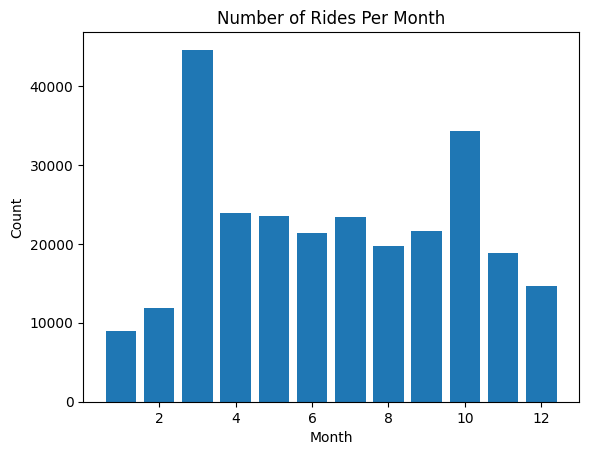

In [20]:
tripbymonth_20142015 = trips[trips['year'].isin([2014,2015])]
tripbymonth = tripbymonth_20142015.groupby(['month']).month.count()
plt.bar(tripbymonth.index, tripbymonth.values)
plt.xlabel('Month')
plt.ylabel('Count')
plt.title('Number of Rides Per Month')
plt.show()

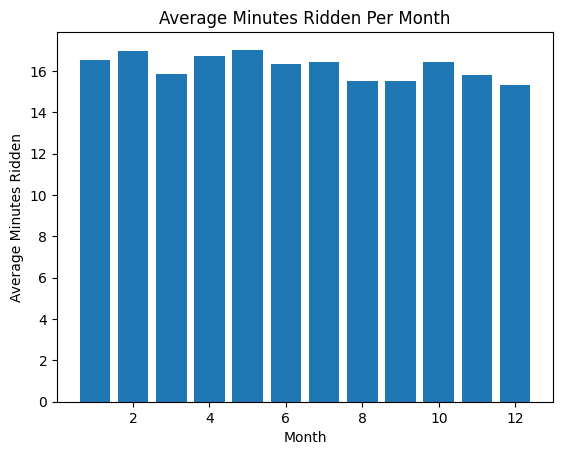

In [21]:
minutesbymonth = tripbymonth_20142015.groupby(['month']).duration_minutes.agg('mean')
plt.bar(minutesbymonth.index, minutesbymonth.values)
plt.xlabel('Month')
plt.ylabel('Average Minutes Ridden')
plt.title('Average Minutes Ridden Per Month')
plt.show()

In [22]:
trips['DateAll']=pd.to_datetime(trips['start_time'], format='%Y-%m-%d %H:%M:%S')
trips['Date']=trips['DateAll'].dt.date
trips['Date']=pd.to_datetime(trips['Date'], format='%Y-%m-%d')
trips['Time']=trips['DateAll'].dt.time
trips['Time']=pd.to_datetime(trips['Time'], format='%H:%M:%S')
trips['DayofWeek'] = trips['Date'].dt.weekday
trips.head()

,bikeid,checkout_time,duration_minutes,end_station_id,end_station_name,month,start_station_id,start_station_name,start_time,subscriber_type,...,roundtrip,route,start_latitude,start_longitude,end_latitude,end_longitude,DateAll,Date,Time,DayofWeek
0,8.0,19:12:00,41,2565.0,Trinity & 6th Street,3.0,2536.0,Waller & 6th St.,2015-03-19 19:12:00,Walk Up,...,False,Waller & 6th St. - Trinity & 6th Street,30.26461,-97.73049,30.26735,-97.73933,2015-03-19 19:12:00,2015-03-19,1900-01-01 19:12:00,3
1,141.0,2:06:04,6,2570.0,South Congress & Academy,10.0,2494.0,2nd & Congress,2016-10-30 02:06:04,Local365,...,False,2nd & Congress - South Congress & Academy,30.26408,-97.74355,30.25226,-97.74854,2016-10-30 02:06:04,2016-10-30,1900-01-01 02:06:04,6
2,578.0,16:28:27,13,2498.0,Convention Center / 4th St. @ MetroRail,3.0,2538.0,Bullock Museum @ Congress & MLK,2016-03-11 16:28:27,Local365,...,False,Bullock Museum @ Congress & MLK - Convention C...,30.28039,-97.73809,30.26483,-97.73900,2016-03-11 16:28:27,2016-03-11,1900-01-01 16:28:27,4
3,86.0,15:39:13,25,3377.0,MoPac Pedestrian Bridge @ Veterans Drive,4.0,2707.0,Rainey St @ Cummings,2017-04-16 15:39:13,Walk Up,...,False,Rainey St @ Cummings - MoPac Pedestrian Bridge...,30.25579,-97.73982,30.27466,-97.77028,2017-04-16 15:39:13,2017-04-16,1900-01-01 15:39:13,6
4,861.0,15:12:00,29,2537.0,West & 6th St.,5.0,2540.0,17th & Guadalupe,2015-05-29 15:12:00,Local30,...,False,17th & Guadalupe - West & 6th St.,30.27974,-97.74254,30.27041,-97.75046,2015-05-29 15:12:00,2015-05-29,1900-01-01 15:12:00,4


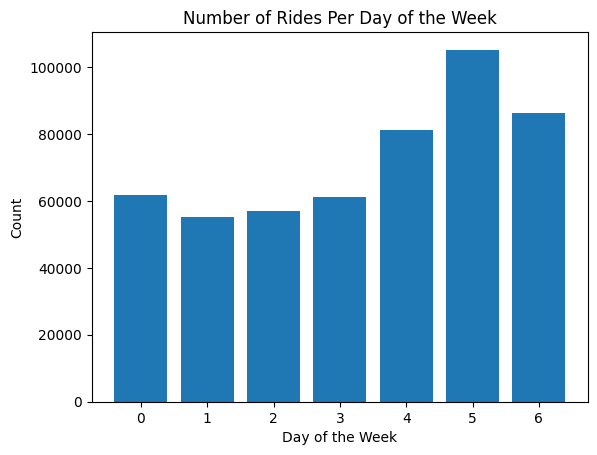

In [23]:
tripbyday = trips.groupby(['DayofWeek']).DayofWeek.count()
plt.bar(tripbyday.index, tripbyday.values)
plt.xlabel('Day of the Week')
plt.ylabel('Count')
plt.title('Number of Rides Per Day of the Week')
plt.show()

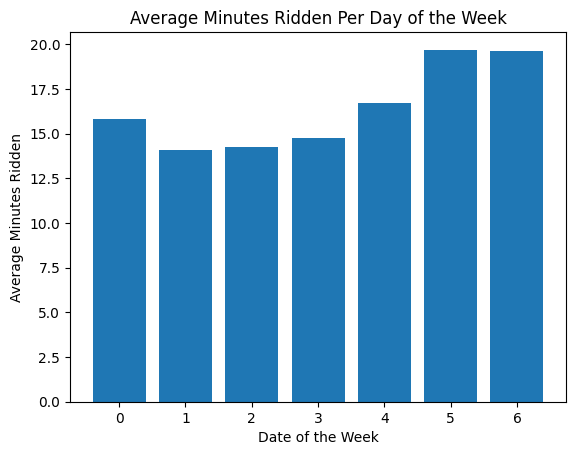

In [24]:
minutesbyday = trips.groupby(['DayofWeek']).duration_minutes.agg('mean')
plt.bar(minutesbyday.index, minutesbyday.values)
plt.xlabel('Date of the Week')
plt.ylabel('Average Minutes Ridden')
plt.title('Average Minutes Ridden Per Day of the Week')
plt.show()

In [25]:
# remove dates which include SouthbySouthwest or ACL.
trips = trips[~trips['Date'].between('2014-03-07','2014-03-17')]
trips = trips[~trips['Date'].between('2015-03-13','2015-03-22')]
trips = trips[~trips['Date'].between('2016-03-11','2016-03-20')]
trips = trips[~trips['Date'].between('2017-03-10','2017-03-19')]
trips = trips[~trips['Date'].between('2014-10-03','2014-10-05')]
trips = trips[~trips['Date'].between('2014-10-10','2014-10-12')]
trips = trips[~trips['Date'].between('2015-10-02','2015-10-04')]
trips = trips[~trips['Date'].between('2015-10-09','2015-10-11')]
trips = trips[~trips['Date'].between('2016-09-30','2016-10-02')]
trips = trips[~trips['Date'].between('2016-10-07','2016-10-09')]
trips

,bikeid,checkout_time,duration_minutes,end_station_id,end_station_name,month,start_station_id,start_station_name,start_time,subscriber_type,...,roundtrip,route,start_latitude,start_longitude,end_latitude,end_longitude,DateAll,Date,Time,DayofWeek
1,141.0,2:06:04,6,2570.0,South Congress & Academy,10.0,2494.0,2nd & Congress,2016-10-30 02:06:04,Local365,...,False,2nd & Congress - South Congress & Academy,30.26408,-97.74355,30.25226,-97.74854,2016-10-30 02:06:04,2016-10-30,1900-01-01 02:06:04,6
3,86.0,15:39:13,25,3377.0,MoPac Pedestrian Bridge @ Veterans Drive,4.0,2707.0,Rainey St @ Cummings,2017-04-16 15:39:13,Walk Up,...,False,Rainey St @ Cummings - MoPac Pedestrian Bridge...,30.25579,-97.73982,30.27466,-97.77028,2017-04-16 15:39:13,2017-04-16,1900-01-01 15:39:13,6
4,861.0,15:12:00,29,2537.0,West & 6th St.,5.0,2540.0,17th & Guadalupe,2015-05-29 15:12:00,Local30,...,False,17th & Guadalupe - West & 6th St.,30.27974,-97.74254,30.27041,-97.75046,2015-05-29 15:12:00,2015-05-29,1900-01-01 15:12:00,4
5,382.0,12:24:16,17,2575.0,Riverside @ S. Lamar,7.0,2567.0,Palmer Auditorium,2016-07-26 12:24:16,Walk Up,...,False,Palmer Auditorium - Riverside @ S. Lamar,30.25971,-97.75346,30.26446,-97.75665,2016-07-26 12:24:16,2016-07-26,1900-01-01 12:24:16,1
6,435.0,13:12:00,49,2575.0,Riverside @ S. Lamar,1.0,2575.0,Riverside @ S. Lamar,2015-01-15 13:12:00,Walk Up,...,True,Riverside @ S. Lamar - Riverside @ S. Lamar,30.26446,-97.75665,30.26446,-97.75665,2015-01-15 13:12:00,2015-01-15,1900-01-01 13:12:00,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
507562,347.0,11:12:00,11,2822.0,East 6th at Robert Martinez,12.0,2496.0,8th & Congress,2014-12-13 11:12:00,Local365,...,False,8th & Congress - East 6th at Robert Martinez,30.26980,-97.74186,30.26032,-97.71899,2014-12-13 11:12:00,2014-12-13,1900-01-01 11:12:00,5
507563,334.0,15:56:11,16,3377.0,MoPac Pedestrian Bridge @ Veterans Drive,5.0,2575.0,Riverside @ S. Lamar,2016-05-09 15:56:11,Walk Up,...,False,Riverside @ S. Lamar - MoPac Pedestrian Bridge...,30.26446,-97.75665,30.27466,-97.77028,2016-05-09 15:56:11,2016-05-09,1900-01-01 15:56:11,0
507564,104.0,17:20:44,53,2499.0,City Hall / Lavaca & 2nd,2.0,3619.0,6th & Congress,2017-02-06 17:20:44,Walk Up,...,False,6th & Congress - City Hall / Lavaca & 2nd,30.26822,-97.74285,30.26476,-97.74678,2017-02-06 17:20:44,2017-02-06,1900-01-01 17:20:44,0
507565,240.0,13:12:55,44,2495.0,4th & Congress,11.0,2495.0,4th & Congress,2015-11-18 13:12:55,Walk Up,...,True,4th & Congress - 4th & Congress,30.26634,-97.74378,30.26634,-97.74378,2015-11-18 13:12:55,2015-11-18,1900-01-01 13:12:55,2


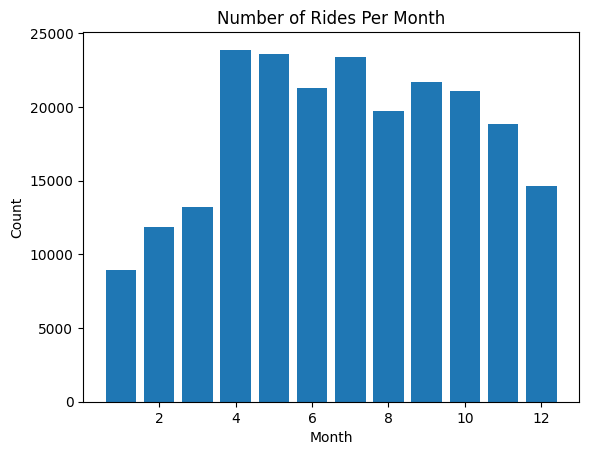

In [26]:
# check rides per month after removal of musical festival periods

tripbymonth_20142015 = trips[trips['year'].isin([2014,2015])]
tripbymonth = tripbymonth_20142015.groupby(['month']).month.count()
plt.bar(tripbymonth.index, tripbymonth.values)
plt.xlabel('Month')
plt.ylabel('Count')
plt.title('Number of Rides Per Month')
plt.show()

In [27]:
weather.head()

,Date,TempHighF,TempAvgF,TempLowF,DewPointHighF,DewPointAvgF,DewPointLowF,HumidityHighPercent,HumidityAvgPercent,HumidityLowPercent,...,SeaLevelPressureAvgInches,SeaLevelPressureLowInches,VisibilityHighMiles,VisibilityAvgMiles,VisibilityLowMiles,WindHighMPH,WindAvgMPH,WindGustMPH,PrecipitationSumInches,Events
0,2013-12-21,74,60,45,67,49,43,93,75,57,...,29.68,29.59,10,7,2,20,4,31,0.46,"Rain , Thunderstorm"
1,2013-12-22,56,48,39,43,36,28,93,68,43,...,30.13,29.87,10,10,5,16,6,25,0,
2,2013-12-23,58,45,32,31,27,23,76,52,27,...,30.49,30.41,10,10,10,8,3,12,0,
3,2013-12-24,61,46,31,36,28,21,89,56,22,...,30.45,30.3,10,10,7,12,4,20,0,
4,2013-12-25,58,50,41,44,40,36,86,71,56,...,30.33,30.27,10,10,7,10,2,16,T,


In [28]:
weather['Date']=pd.to_datetime(weather['Date'], format='%Y-%m-%d')
weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1319 entries, 0 to 1318
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   Date                        1319 non-null   datetime64[ns]
 1   TempHighF                   1319 non-null   int64         
 2   TempAvgF                    1319 non-null   int64         
 3   TempLowF                    1319 non-null   int64         
 4   DewPointHighF               1319 non-null   object        
 5   DewPointAvgF                1319 non-null   object        
 6   DewPointLowF                1319 non-null   object        
 7   HumidityHighPercent         1319 non-null   object        
 8   HumidityAvgPercent          1319 non-null   object        
 9   HumidityLowPercent          1319 non-null   object        
 10  SeaLevelPressureHighInches  1319 non-null   object        
 11  SeaLevelPressureAvgInches   1319 non-null   object      

In [29]:
RidesPerDay = trips
RidesPerDay = RidesPerDay.groupby(['Date']).trip_id.agg('count')
RidesPerDay = RidesPerDay.reset_index()
RidesPerDay = RidesPerDay.rename(columns={'trip_id':'trip_count'})
RidesPerDay

,Date,trip_count
0,2013-12-21,86
1,2013-12-22,95
2,2013-12-23,76
3,2013-12-24,69
4,2013-12-25,94
...,...,...
1132,2017-05-27,987
1133,2017-05-28,851
1134,2017-05-29,650
1135,2017-05-30,491


In [30]:
DurationPerDay = trips
DurationPerDay = DurationPerDay.groupby('Date').duration_minutes.agg('mean')
DurationPerDay = DurationPerDay.reset_index()
DurationPerDay = DurationPerDay.rename(columns={'duration_minutes':'duration_minutes_avg'})
DurationPerDay

,Date,duration_minutes_avg
0,2013-12-21,13.662791
1,2013-12-22,18.810526
2,2013-12-23,18.447368
3,2013-12-24,20.898551
4,2013-12-25,24.989362
...,...,...
1132,2017-05-27,25.613982
1133,2017-05-28,26.078731
1134,2017-05-29,22.761538
1135,2017-05-30,20.077393


In [31]:
DayOfWeek = trips
DayOfWeek = DayOfWeek.groupby('Date').DayofWeek.agg('mean')
DayOfWeek = DayOfWeek.reset_index()
DayOfWeek

,Date,DayofWeek
0,2013-12-21,5.0
1,2013-12-22,6.0
2,2013-12-23,0.0
3,2013-12-24,1.0
4,2013-12-25,2.0
...,...,...
1132,2017-05-27,5.0
1133,2017-05-28,6.0
1134,2017-05-29,0.0
1135,2017-05-30,1.0


# Modeling

To model the average bike ride duration per day based on date, day of the week, and daily weather conditions, we employ the SARIMAX model (Seasonal AutoRegressive Integrated Moving Average with exogenous regressors). We first consolidate all relevant variables, such as ride durations, weather metrics (e.g., temperature, humidity), and calendar features—into a single, time-indexed DataFrame. Before fitting the model, we assess the stationarity of the time series using statistical tests. Since the data meets the stationarity assumption, we proceed by splitting the dataset into training and testing sets, for accurate forecasting and evaluation.

In [32]:
RideWeather = pd.merge(DurationPerDay[['duration_minutes_avg','Date']], weather[['Date','TempAvgF','DewPointAvgF','HumidityAvgPercent','SeaLevelPressureAvgInches','VisibilityAvgMiles','WindAvgMPH','PrecipitationSumInches','Events']], on='Date')
RideWeather = pd.merge(RideWeather, RidesPerDay[['trip_count','Date']], on='Date')
RideWeather = pd.merge(RideWeather, DayOfWeek[['DayofWeek','Date']], on='Date')
RideWeather

,duration_minutes_avg,Date,TempAvgF,DewPointAvgF,HumidityAvgPercent,SeaLevelPressureAvgInches,VisibilityAvgMiles,WindAvgMPH,PrecipitationSumInches,Events,trip_count,DayofWeek
0,13.662791,2013-12-21,60,49,75,29.68,7,4,0.46,"Rain , Thunderstorm",86,5.0
1,18.810526,2013-12-22,48,36,68,30.13,10,6,0,,95,6.0
2,18.447368,2013-12-23,45,27,52,30.49,10,3,0,,76,0.0
3,20.898551,2013-12-24,46,28,56,30.45,10,4,0,,69,1.0
4,24.989362,2013-12-25,50,40,71,30.33,10,2,T,,94,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...
1132,25.613982,2017-05-27,87,74,71,29.85,6,7,0.01,Rain,987,5.0
1133,26.078731,2017-05-28,80,71,73,29.87,9,4,0.47,"Rain , Thunderstorm",851,6.0
1134,22.761538,2017-05-29,78,67,70,30,10,2,0,,650,0.0
1135,20.077393,2017-05-30,78,66,68,30.02,10,2,0,,491,1.0


In [33]:
RideWeatherTS = RideWeather.set_index('Date')
RideWeatherTS

,duration_minutes_avg,TempAvgF,DewPointAvgF,HumidityAvgPercent,SeaLevelPressureAvgInches,VisibilityAvgMiles,WindAvgMPH,PrecipitationSumInches,Events,trip_count,DayofWeek
Date,,,,,,,,,,,
2013-12-21,13.662791,60,49,75,29.68,7,4,0.46,"Rain , Thunderstorm",86,5.0
2013-12-22,18.810526,48,36,68,30.13,10,6,0,,95,6.0
2013-12-23,18.447368,45,27,52,30.49,10,3,0,,76,0.0
2013-12-24,20.898551,46,28,56,30.45,10,4,0,,69,1.0
2013-12-25,24.989362,50,40,71,30.33,10,2,T,,94,2.0
...,...,...,...,...,...,...,...,...,...,...,...
2017-05-27,25.613982,87,74,71,29.85,6,7,0.01,Rain,987,5.0
2017-05-28,26.078731,80,71,73,29.87,9,4,0.47,"Rain , Thunderstorm",851,6.0
2017-05-29,22.761538,78,67,70,30,10,2,0,,650,0.0


In [34]:
RideWeatherTS['Events'].value_counts()

,count
Events,
,779
Rain,168
"Rain , Thunderstorm",117
"Fog , Rain , Thunderstorm",30
Fog,19
Thunderstorm,13
"Fog , Rain",9
"Rain , Snow",1
"Fog , Thunderstorm",1


In [35]:
RideWeatherTS['Rain'] = np.where(RideWeatherTS['Events'].str.contains('Rain'),1,0)
RideWeatherTS['Snow'] = np.where(RideWeatherTS['Events'].str.contains('Snow'),1,0)
RideWeatherTS['Fog'] = np.where(RideWeatherTS['Events'].str.contains('Fog'),1,0)
RideWeatherTS['Thunderstorm'] = np.where(RideWeatherTS['Events'].str.contains('Thunderstorm'),1,0)
RideWeatherTS = RideWeatherTS.drop(columns=['Events'])
RideWeatherTS['PrecipitationSumInches'] = np.where(RideWeatherTS['PrecipitationSumInches'] == 'T', .001, RideWeatherTS['PrecipitationSumInches'])
RideWeatherTS

,duration_minutes_avg,TempAvgF,DewPointAvgF,HumidityAvgPercent,SeaLevelPressureAvgInches,VisibilityAvgMiles,WindAvgMPH,PrecipitationSumInches,trip_count,DayofWeek,Rain,Snow,Fog,Thunderstorm
Date,,,,,,,,,,,,,,
2013-12-21,13.662791,60,49,75,29.68,7,4,0.46,86,5.0,1,0,0,1
2013-12-22,18.810526,48,36,68,30.13,10,6,0,95,6.0,0,0,0,0
2013-12-23,18.447368,45,27,52,30.49,10,3,0,76,0.0,0,0,0,0
2013-12-24,20.898551,46,28,56,30.45,10,4,0,69,1.0,0,0,0,0
2013-12-25,24.989362,50,40,71,30.33,10,2,0.001,94,2.0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-05-27,25.613982,87,74,71,29.85,6,7,0.01,987,5.0,1,0,0,0
2017-05-28,26.078731,80,71,73,29.87,9,4,0.47,851,6.0,1,0,0,1
2017-05-29,22.761538,78,67,70,30,10,2,0,650,0.0,0,0,0,0


In [36]:
columns_to_convert = ['DewPointAvgF', 'HumidityAvgPercent', 'SeaLevelPressureAvgInches', 'VisibilityAvgMiles', 'WindAvgMPH', 'PrecipitationSumInches']
for col in columns_to_convert:
  RideWeatherTS[col] = pd.to_numeric(RideWeatherTS[col], errors='coerce')

RideWeatherTS = RideWeatherTS.dropna()
RideWeatherTS.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1125 entries, 2013-12-21 to 2017-05-31
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   duration_minutes_avg       1125 non-null   float64
 1   TempAvgF                   1125 non-null   int64  
 2   DewPointAvgF               1125 non-null   float64
 3   HumidityAvgPercent         1125 non-null   float64
 4   SeaLevelPressureAvgInches  1125 non-null   float64
 5   VisibilityAvgMiles         1125 non-null   float64
 6   WindAvgMPH                 1125 non-null   float64
 7   PrecipitationSumInches     1125 non-null   float64
 8   trip_count                 1125 non-null   int64  
 9   DayofWeek                  1125 non-null   float64
 10  Rain                       1125 non-null   int64  
 11  Snow                       1125 non-null   int64  
 12  Fog                        1125 non-null   int64  
 13  Thunderstorm               112

In [37]:
durationseries = RideWeatherTS['duration_minutes_avg']
durationresult = adfuller(durationseries)

print('ADF Statistic: %f' % durationresult[0])
print('p-value: %f' % durationresult[1])

ADF Statistic: -3.800722
p-value: 0.002900


In [38]:
countseries = RideWeatherTS['trip_count']
countresult = adfuller(countseries)
print('ADF Statistic: %f' % countresult[0])
print('p-value: %f' % countresult[1])

ADF Statistic: -3.503486
p-value: 0.007898


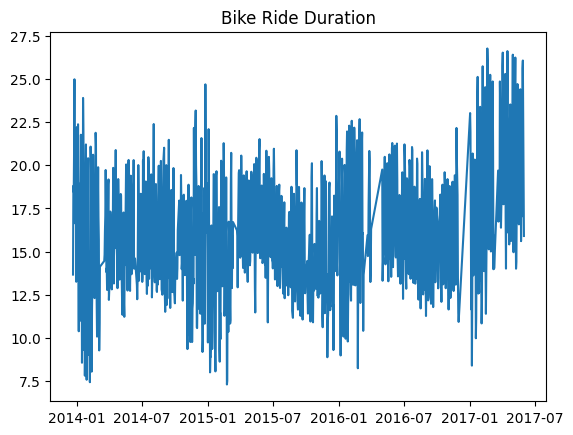

In [39]:
plt.plot(durationseries)
plt.title('Bike Ride Duration')
plt.show()

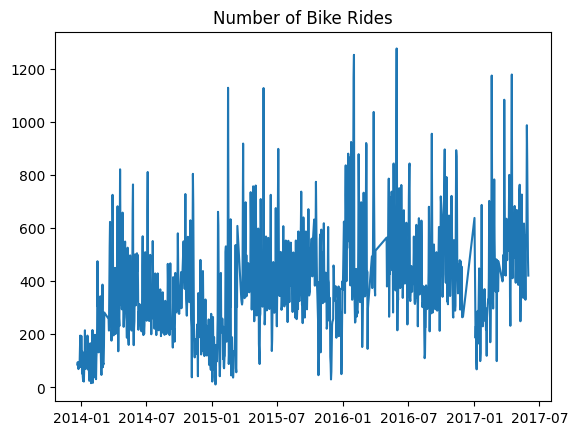

In [40]:
plt.plot(countseries)
plt.title('Number of Bike Rides')
plt.show()

In [41]:
tscv = TimeSeriesSplit(n_splits=3)

for train_index, test_index in tscv.split(RideWeatherTS):
    train, test = RideWeatherTS.iloc[train_index], RideWeatherTS.iloc[test_index]
    break

y_train = train['duration_minutes_avg']
X_train = train.drop(columns=['duration_minutes_avg','trip_count'])
y_test = test['duration_minutes_avg']
X_test = test.drop(columns=['duration_minutes_avg','trip_count'])

print(f"  train period: {X_train.index[0]} to {X_train.index[-1]}")
print(f"  test period : {X_test.index[0]} to {X_test.index[-1]}")

duration_model = SARIMAX(y_train, exog=X_train, order=(1,1,1))
duration_results = duration_model.fit()

duration_forecast = duration_results.predict(start=len(y_train), end=len(y_train)+len(y_test)-1, exog=X_test)
mse = mean_squared_error(y_test, duration_forecast)
rmse = np.sqrt(mse)
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")

relative_error = rmse / np.mean(y_test)
print(f"Relative Error: {relative_error}")

  train period: 2013-12-21 00:00:00 to 2014-10-20 00:00:00
  test period : 2014-10-21 00:00:00 to 2015-08-07 00:00:00
MSE: 7.338277564408104
RMSE: 2.708925536888769
Relative Error: 0.17624767185296386


In [42]:
duration_model = SARIMAX(y_train, exog=X_train, order=(1,1,1))
duration_results = duration_model.fit()

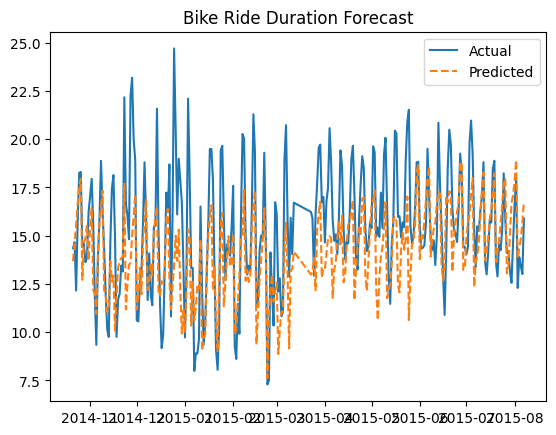

In [43]:
plt.plot(y_test.index, y_test, label='Actual')
plt.plot(y_test.index, duration_forecast, label='Predicted', linestyle='--')
plt.title('Bike Ride Duration Forecast')
plt.legend()
plt.show()

In [44]:
p = d = q = range(0, 2)
P = D = Q = range(0, 2)
s = [7]

param = list(itertools.product(p, d, q, P, D, Q, s))

In [45]:
best_rmse = float("inf")
best_params = None

for params in param:
  model_best = SARIMAX(y_train, exog=X_train, order=(params[0],params[1],params[2]), seasonal_order=(params[3],params[4],params[5],params[6]))
  results = model_best.fit()

  y_pred = results.predict(start=len(y_train), end=len(y_train)+len(y_test)-1, exog=X_test)
  mse = mean_squared_error(y_test, y_pred)
  rmse = np.sqrt(mse)

  if rmse < best_rmse:
    best_rmse = rmse
    best_params = params

print(best_rmse)
print(best_params)

2.4361353165055695
(1, 0, 0, 1, 0, 1, 7)


In [46]:
duration_model_best = SARIMAX(y_train, exog=X_train, order=(1,0,0), seasonal_order=(1,0,1,7))
duration_results_best = duration_model_best.fit()

duration_forecast_best = duration_results_best.predict(start=len(y_train), end=len(y_train)+len(y_test)-1, exog=X_test)
mse = mean_squared_error(y_test, duration_forecast_best)
rmse = np.sqrt(mse)
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")

relative_error = rmse / np.mean(y_test)
print(f"Relative Error: {relative_error}")

MSE: 5.9347552803256916
RMSE: 2.4361353165055695
Relative Error: 0.15849943898643234


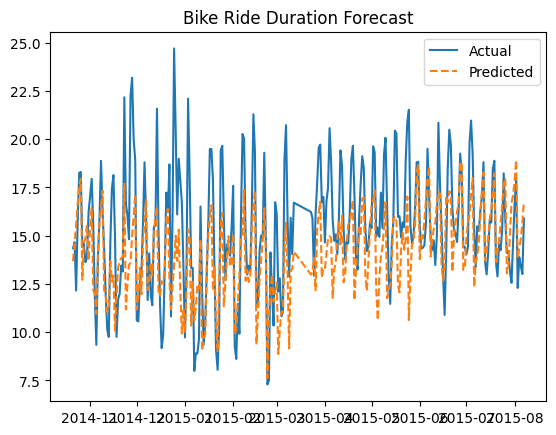

In [47]:
plt.plot(y_test.index, y_test, label='Actual')
plt.plot(y_test.index, duration_forecast, label='Predicted', linestyle='--')
plt.title('Bike Ride Duration Forecast')
plt.legend()
plt.show()

In [48]:
tscv = TimeSeriesSplit(n_splits=3)

for train_index, test_index in tscv.split(RideWeatherTS):
    train, test = RideWeatherTS.iloc[train_index], RideWeatherTS.iloc[test_index]
    break

y_train = train['trip_count']
X_train = train.drop(columns=['trip_count','duration_minutes_avg'])
y_test = test['trip_count']
X_test = test.drop(columns=['trip_count','duration_minutes_avg'])

print(f"  train period: {X_train.index[0]} to {X_train.index[-1]}")
print(f"  test period : {X_test.index[0]} to {X_test.index[-1]}")

count_model = SARIMAX(y_train, exog=X_train, order=(1,1,1))
count_results = count_model.fit()

count_forecast = count_results.predict(start=len(y_train), end=len(y_train)+len(y_test)-1, exog=X_test)
mse = mean_squared_error(y_test, count_forecast)
rmse = np.sqrt(mse)
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")

relative_error = rmse / np.mean(y_test)
print(f"Relative Error: {relative_error}")

best_rmse = float("inf")
best_params = None

for params in param:
  count_model_best = SARIMAX(y_train, exog=X_train, order=(params[0],params[1],params[2]), seasonal_order=(params[3],params[4],params[5],params[6]))
  count_results = count_model_best.fit()

  y_pred = count_results.predict(start=len(y_train), end=len(y_train)+len(y_test)-1, exog=X_test)
  mse = mean_squared_error(y_test, y_pred)
  rmse = np.sqrt(mse)

  if rmse < best_rmse:
    best_rmse = rmse
    best_params = params

print(best_rmse)
print(best_params)

  train period: 2013-12-21 00:00:00 to 2014-10-20 00:00:00
  test period : 2014-10-21 00:00:00 to 2015-08-07 00:00:00
MSE: 22858.331138474794
RMSE: 151.18971902373121
Relative Error: 0.46228847710194204
144.70389150547493
(1, 1, 0, 0, 0, 0, 7)


In [49]:
count_model_best = SARIMAX(y_train, exog=X_train, order=(1,1,0), seasonal_order=(0,0,0,7))
count_results_best = count_model_best.fit()

count_forecast_best = count_results_best.predict(start=len(y_train), end=len(y_train)+len(y_test)-1, exog=X_test)
mse = mean_squared_error(y_test, count_forecast_best)
rmse = np.sqrt(mse)
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")

relative_error = rmse / np.mean(y_test)
print(f"Relative Error: {relative_error}")

MSE: 20939.216216828263
RMSE: 144.70389150547493
Relative Error: 0.44245694791119106


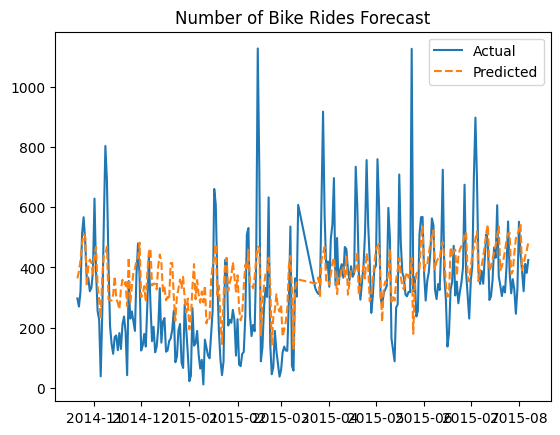

In [50]:
plt.plot(y_test.index, y_test, label='Actual')
plt.plot(y_test.index, count_forecast, label='Predicted', linestyle='--')
plt.title('Number of Bike Rides Forecast')
plt.legend()
plt.show()

# Evaluation

After fitting the original model to the training data and running the model on our testing data, we compare those predictions to the actual testing dataset.  The RMSE for this model is 2.71.

After running a grid search, the updated model dropped the RMSE to 2.43.  These results tell us that, on average, the model's predictions are within 2.43 minutes of the actual daily average bike ride duration.  Based on the mean of the daily average bike ride duration, this is a 15.85% relative error.  These statistics indicate that this model is reasonably effective at capturing the relationship between weather, date and ride duration.

Evaluating the model on number of bike rides per day rather than duration of bike rides did not provide us with a reasonable relationship.

# Conclusion

Using this model to predict the duration of a ride given the day and weather patterns allows us to predict the use of bicycles in another town based on their weather patterns.

# Limitations and Next Steps

The largest limitation in this analysis is that the demographics of the two cities are the same.  It would be a good next step to bring in studies regarding the city populations.  If the populations differ greatly on age, gender or activity level, we will want to adjust the model accordingly.

Additionally, while our weather model was good for predicting the duration of a bike ride, it was not great for predicting the number of bike rides on a given day.  We will want to research and model what other factors could be influencing the number of rides in a given day.

Using those two pieces of information we can predict how many bikes we will need in Merrytown.  We can determine how much money it will bring in based on the number rides and duration.  We can also determine if specials on poor weather days or offering commuter discounts would be beneficial.